In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import shap
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import image_dataset_from_directory
import os
from keras.utils import load_img, img_to_array
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans
import torch
from PIL import Image
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from torchvision import models, transforms
from tqdm import tqdm
import cv2
from tensorflow.keras.applications import ResNet50

In [2]:
# Step 1: Load and preprocess the image dataset with higher resolution
data = image_dataset_from_directory(
    'flowers',
    image_size=(256, 256),
    batch_size=32
)

# Normalize images and prepare labels
images, labels = [], []
for image_batch, label_batch in data:
    images.append(image_batch.numpy())
    labels.append(label_batch.numpy())

images = np.concatenate(images) / 255.0
labels = np.concatenate(labels)

# Filter to include only 'rose' and 'sunflower' classes
mask = labels < 2
images, labels = images[mask], labels[mask]


Found 1517 files belonging to 2 classes.


In [3]:
# Load ResNet50 with pre-trained ImageNet weights, exclude the top fully connected layers
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(256, 256, 3))

# Freeze base model layers to prevent training
base_model.trainable = False

# Add custom layers for rose/sunflower classification
x = base_model.output
x = GlobalAveragePooling2D(name='GlobalAvgPool')(x)  # Pooling to reduce dimensions
x = Dense(128, activation="relu", name="Dense1")(x)  # Fully connected layer
outputs = Dense(2, activation="softmax", name="Softmax")(x)  # Output for 2 classes

# Build the model
resnet_model = Model(inputs=base_model.input, outputs=outputs)

In [4]:
resnet_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss=CategoricalCrossentropy(),
    metrics=['acc']
)

In [5]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, stratify=labels, test_size=0.2, random_state=11)
y_train_one_hot = to_categorical(y_train, num_classes=2)
y_test_one_hot = to_categorical(y_test, num_classes=2)

In [6]:
resnet_model.fit(
    X_train,
    y_train_one_hot,
    validation_split=0.15,  # Use 15% of training data for validation
    batch_size=10,
    epochs=5  # Initially train for a few epochs
)

# # Optionally, unfreeze some layers and fine-tune
# base_model.trainable = True
# resnet_model.compile(optimizer=Adam(learning_rate=0.0001), loss=CategoricalCrossentropy(), metrics=['acc'])
# resnet_model.fit(
#     X_train,
#     y_train_one_hot,
#     validation_split=0.15,
#     batch_size=32,
#     epochs=5  # Fine-tuning for additional epochs
# )


Epoch 1/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 99s 867ms/step - acc: 0.4995 - loss: 0.7680 - val_acc: 0.5604 - val_loss: 0.6499
Epoch 2/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 90s 866ms/step - acc: 0.5773 - loss: 0.6951 - val_acc: 0.5934 - val_loss: 0.6157
Epoch 3/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 89s 848ms/step - acc: 0.6125 - loss: 0.6501 - val_acc: 0.7418 - val_loss: 0.5755
Epoch 4/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 88s 847ms/step - acc: 0.6362 - loss: 0.6110 - val_acc: 0.6813 - val_loss: 0.5858
Epoch 5/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 92s 885ms/step - acc: 0.6615 - loss: 0.6204 - val_acc: 0.7637 - val_loss: 0.5607


In [7]:
def extract_embeddings(cnn_model, images):
    feature_extractor = Model(inputs=cnn_model.input, outputs=cnn_model.get_layer("Dense1").output)
    return feature_extractor.predict(images)


X_train_embed = extract_embeddings(resnet_model, X_train)
X_test_embed = extract_embeddings(resnet_model, X_test)



# Step 2: Train a Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_embed, y_train)

# Step 3: Evaluate the model
y_pred = rf_model.predict(X_test_embed)
accuracy = accuracy_score(y_test, y_pred)

print(f"Random Forest Accuracy: {accuracy:.2f}")

38/38 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step
Random Forest Accuracy: 0.75


  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [02:05, 125.07s/it]              


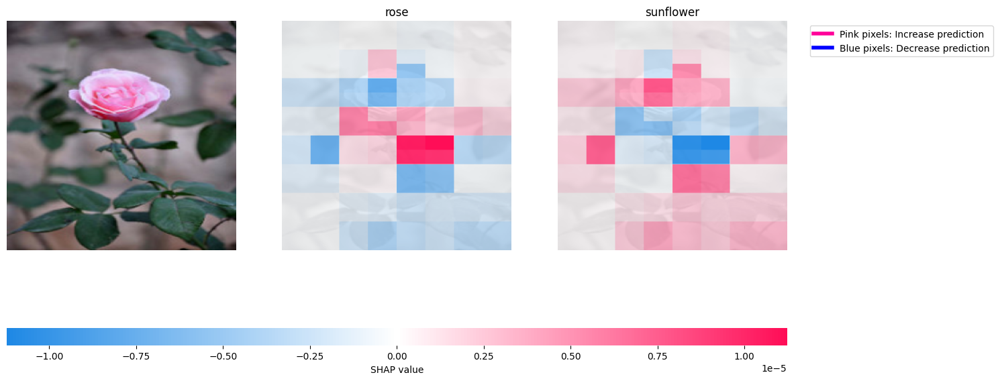

In [8]:
# SHAP Explainer
explainer = shap.Explainer(rf_model)
shap_values = explainer(X_test_embed)

# SHAP Image Masker
def f(x):
    tmp = x.copy()
    return resnet_model(tmp)

masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

ind = [120]

shap_values_ = explainer(X_test[ind], max_evals=1000, batch_size=10)
# Plot SHAP values with custom legends
shap.image_plot(shap_values_, X_test[ind], labels=['rose', 'sunflower'], show=False)

legend_elements = [
    Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
    Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
]
plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
plt.gcf().set_size_inches(15, 10)
plt.show()

c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py:150: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 245, in _count_physical_cores
    raise ValueError(
c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default v

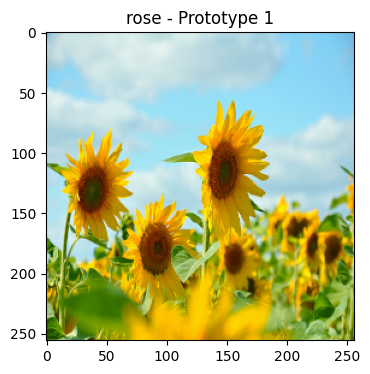

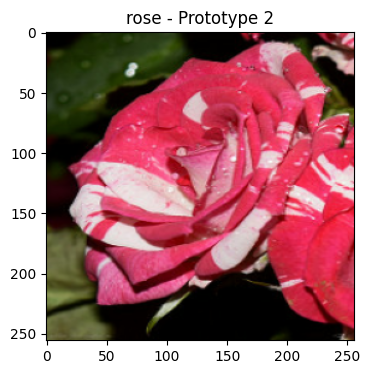

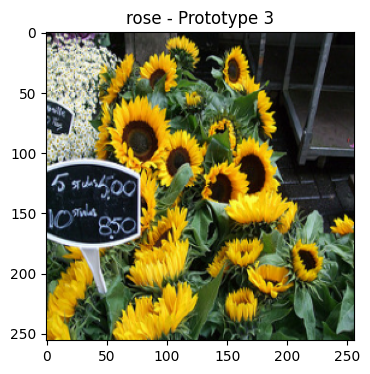

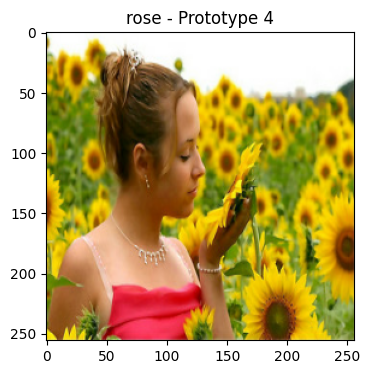

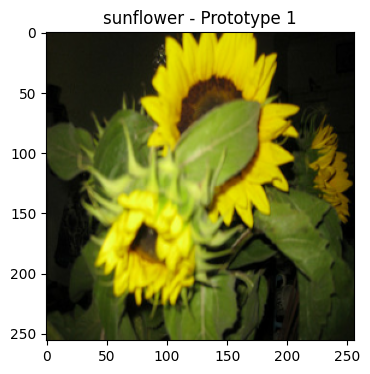

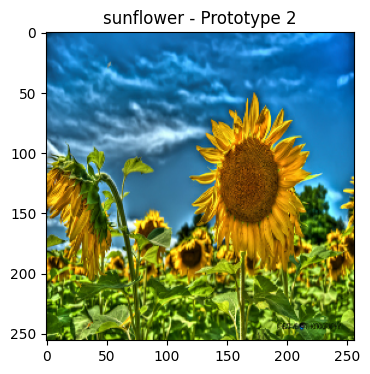

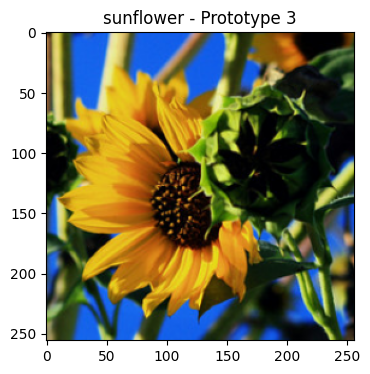

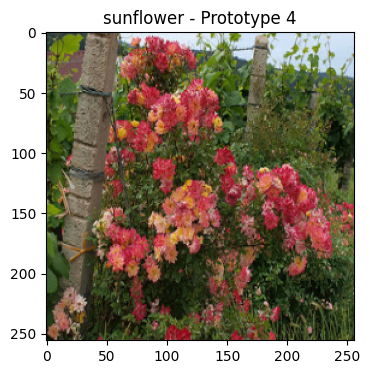

In [9]:
# Prototypes with K-means Clustering
def find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4):
    prototypes = []
    for class_label in np.unique(y_train):
        class_indices = np.where(y_train == class_label)[0]
        class_embeddings = X_train_embed[class_indices]
        
        kmeans = KMeans(n_clusters=n_prototypes, random_state=42).fit(class_embeddings)
        centroids = kmeans.cluster_centers_
        prototypes.append(centroids)
    
    return prototypes

prototypes = find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4)

# Visualize prototypes
def visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best'):
    for class_label, proto_centroids in enumerate(prototypes):
        for i, proto in enumerate(proto_centroids):
            distances = np.linalg.norm(X_test_embed - proto, axis=1)
            prototype_image_index = np.argmin(distances)
            
            plt.figure(figsize=(4, 4))
            plt.imshow(X_test[prototype_image_index])
            plt.title(f"{['rose', 'sunflower'][class_label]} - Prototype {i + 1}")
            plt.show()


visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best')


In [10]:
# # Try SHAP and Prototypes with Additional Images
# additional_images = []
# for filename in os.listdir('test_images'):
#     img = load_img(os.path.join('test_images', filename), target_size=(256, 256))
#     img = img_to_array(img) / 255.0
#     additional_images.append(img)

# additional_images = np.array(additional_images)
# additional_embeddings = extract_embeddings(resnet_model, additional_images)
# additional_predictions = rf_model.predict(additional_embeddings)

# for i, image in enumerate(additional_images):
#     shap_values_ = explainer(image[np.newaxis, ...], max_evals=5000, batch_size=50)
#     shap.image_plot(shap_values_, image[np.newaxis, ...], labels=['rose', 'sunflower'], show=False)

#     legend_elements = [
#         Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
#         Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
#     ]

#     plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
#     plt.gcf().set_size_inches(15, 10)
#     plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


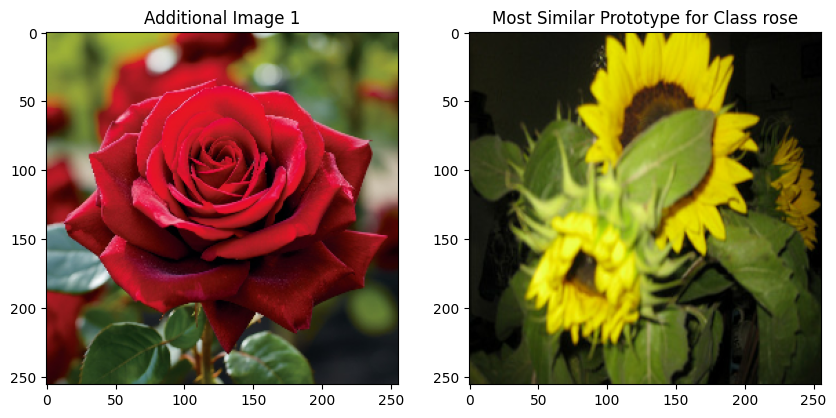

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


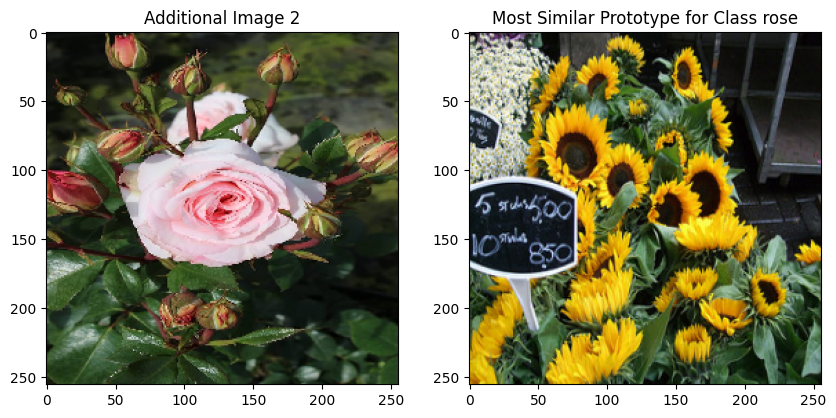

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


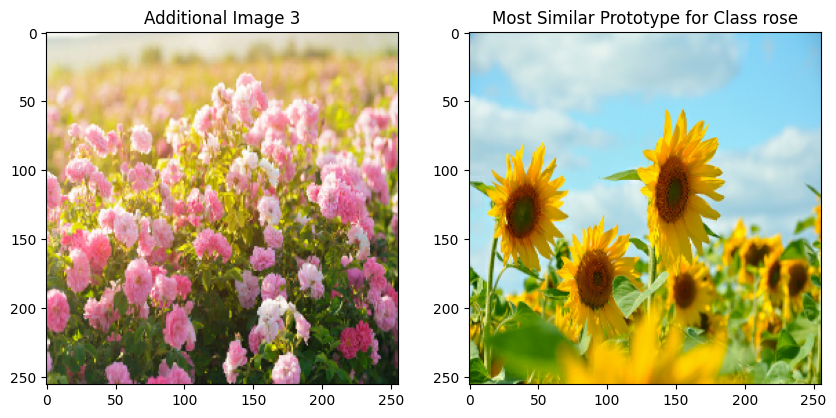

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


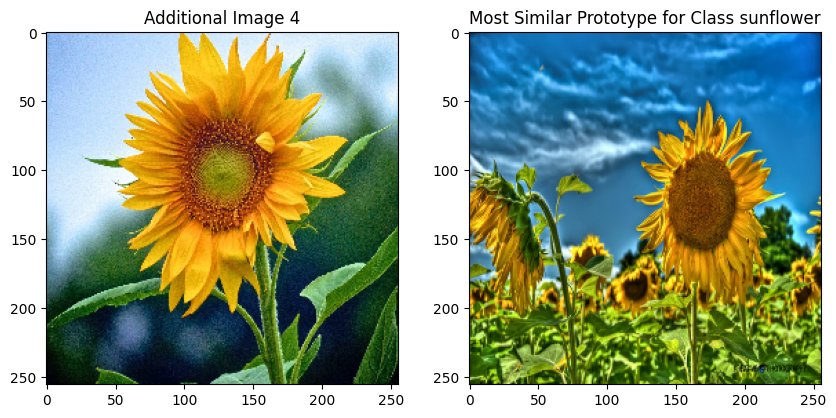

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


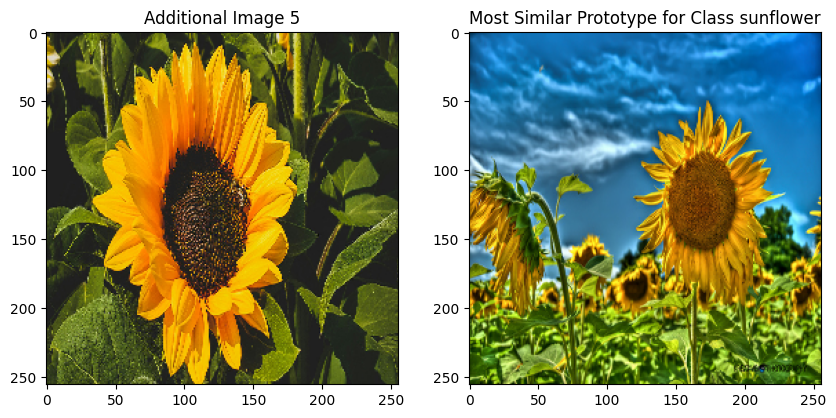

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


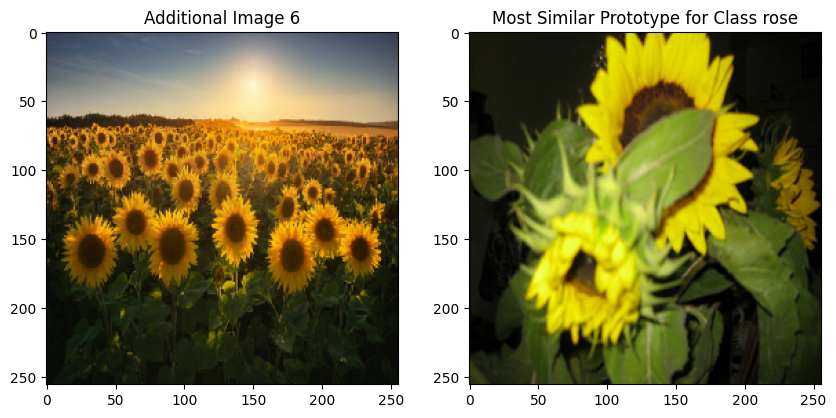

In [11]:
additional_images = []
for filename in os.listdir('test_images'):
    img = load_img(os.path.join('test_images', filename), target_size=(256, 256))
    img = img_to_array(img) / 255.0
    additional_images.append(img)

additional_images = np.array(additional_images)
additional_embeddings = extract_embeddings(resnet_model, additional_images)
additional_predictions = rf_model.predict(additional_embeddings)


def match_prototypes(extra_embed, prototypes):
    min_distance = float('inf')
    closest_prototype = None
    for class_prototypes in prototypes:
        for proto in class_prototypes:
            distance = np.linalg.norm(extra_embed - proto)
            if distance < min_distance:
                min_distance = distance
                closest_prototype = proto
    return closest_prototype

for i, image in enumerate(additional_images):
    most_similar_prototype = match_prototypes(additional_embeddings[i], prototypes)

    predicted_class = np.argmax(resnet_model.predict(image[np.newaxis, ...]))
    class_name = ['rose', 'sunflower'][predicted_class]

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Additional Image {i + 1}")
    plt.subplot(1, 2, 2)
    plt.imshow(X_test[np.argmin(np.linalg.norm(X_test_embed - most_similar_prototype, axis=1))])
    plt.title(f"Most Similar Prototype for Class {class_name}")
    plt.show()

In [12]:
def custom_feature_importance_visualization(model, image, explainer, class_names):
   
    predictions = model.predict(image[np.newaxis, ...], verbose=0)
    predicted_class = np.argmax(predictions)
    
   
    shap_values_ = explainer(image[np.newaxis, ...], max_evals=1000, batch_size=10)
    shap_array = shap_values_[0, :, :, :, predicted_class].values
    shap_array_norm = (shap_array - shap_array.min()) / (shap_array.max() - shap_array.min())
    
    importance_scores = np.abs(shap_array_norm).sum(axis=2)
    
    
    plt.figure(figsize=(8, 5))
    
   
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f'Image predicted as: \n{class_names[predicted_class]}', fontsize=16)
    plt.axis('off')
    
   
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    
    plt.imshow(importance_scores, alpha=0.6, cmap="BrBG")
    plt.title('Feature Importance', fontsize=16)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return predicted_class

  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:55, 115.02s/it]              


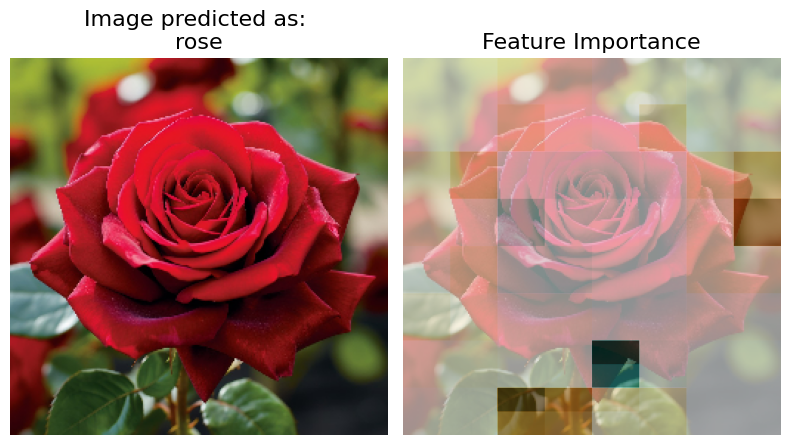

  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:58, 118.06s/it]              


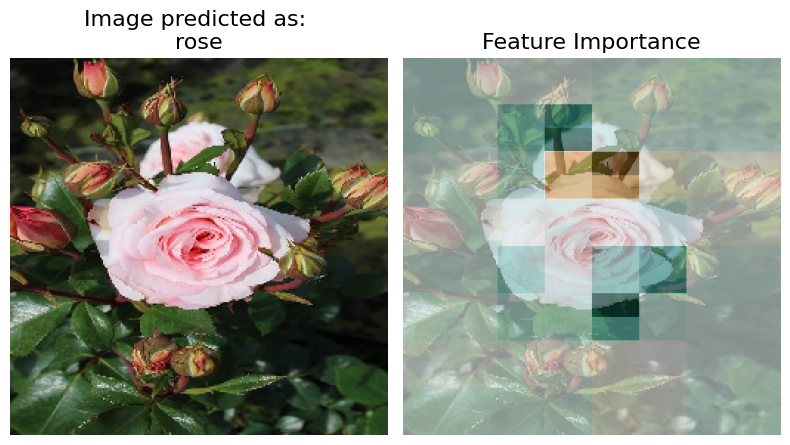

  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [02:08, 128.84s/it]              


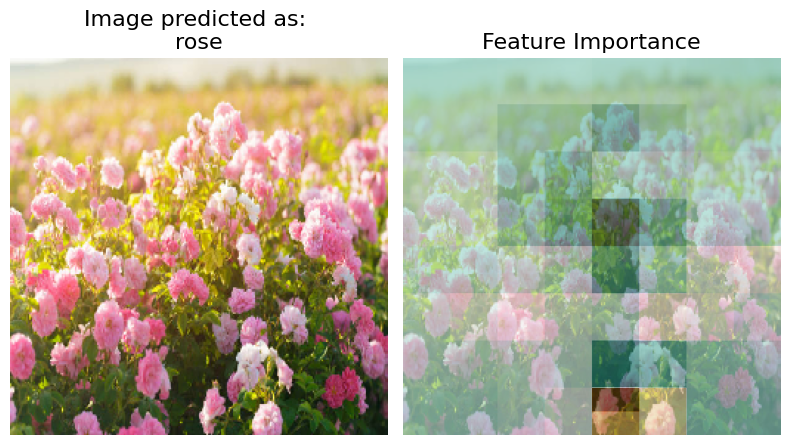

  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:58, 118.97s/it]              


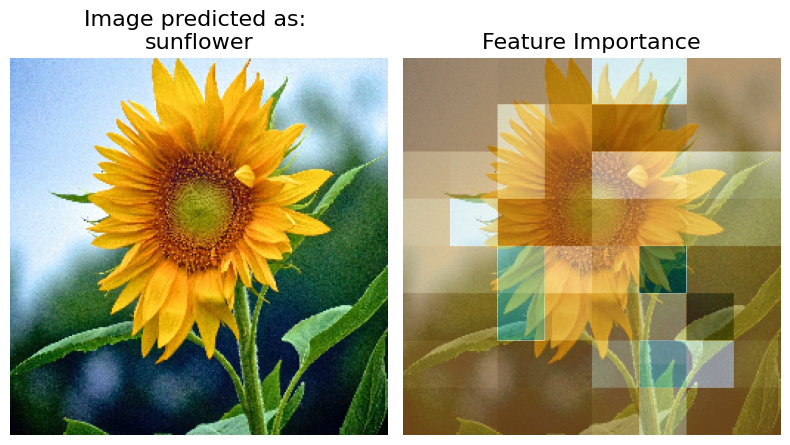

  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:57, 117.67s/it]              


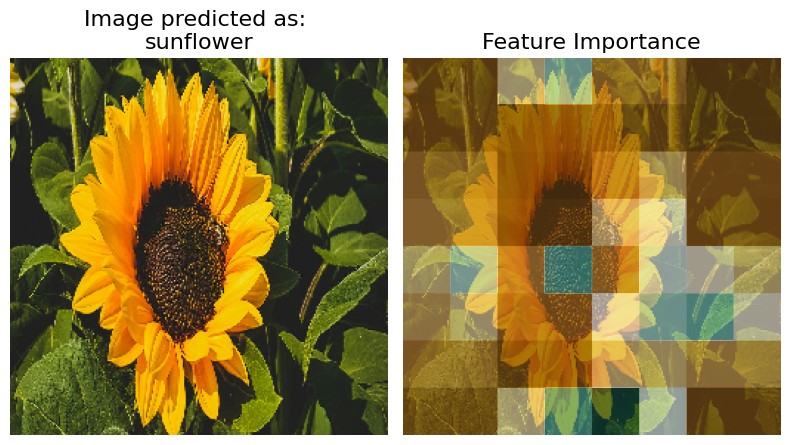

  0%|          | 0/998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:56, 116.98s/it]              


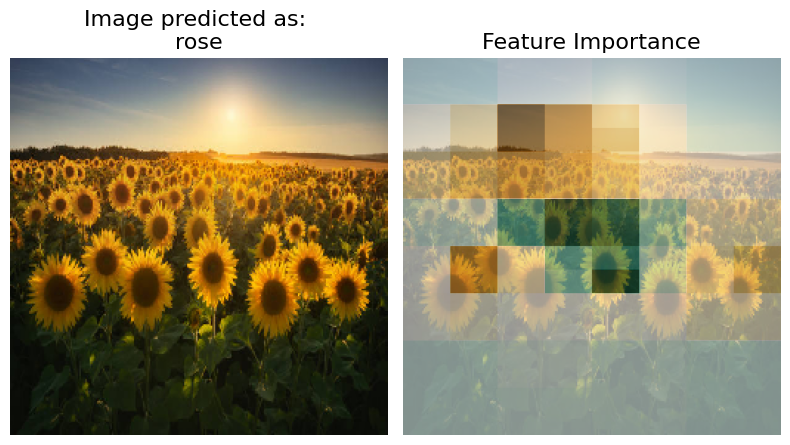

In [13]:
masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

class_names = ['rose', 'sunflower']


for image in additional_images:
    custom_feature_importance_visualization(resnet_model, image, explainer, class_names)